<a href="https://colab.research.google.com/github/aadil1073/Data-Science/blob/main/Level_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

***LEVEL 1 TASK 1-Data Exploration and Preprocessing ***

In [ ]:
# Importing libraries
import pandas as pd

In [ ]:
# Loading the Dataset
df = pd.read_csv('/content/Dataset .csv')

In [ ]:
# Getting the number of rows and columns
num_rows, num_columns = df.shape
print("Number of rows:", num_rows)
print("Number of columns:", num_columns)


Number of rows: 9551
Number of columns: 21


In [ ]:
# Checking for missing values
missing_values = df.isnull().sum()
print("Missing values in each column:")
print(missing_values)

# Handle missing values
df.dropna(inplace=True)

Missing values in each column:
Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [ ]:
# Performing Data Type Conversion
df['Country Code'] = df['Country Code'].astype('category')


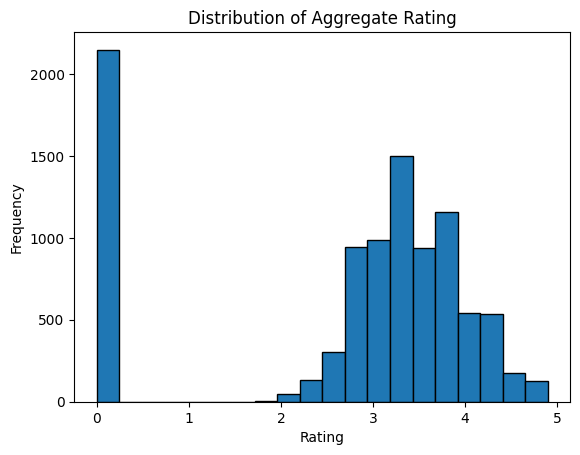

Counts of each rating:
0.0    2148
3.2     522
3.1     519
3.4     495
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     399
2.9     381
3.9     332
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     143
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      41
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: Aggregate rating, dtype: int64


In [ ]:
import matplotlib.pyplot as plt

# Plotting the distribution of 'Aggregate rating'
plt.hist(df['Aggregate rating'], bins=20, edgecolor='black')
plt.title('Distribution of Aggregate Rating')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.show()

# Checking for class imbalance
rating_counts = df['Aggregate rating'].value_counts()
print("Counts of each rating:")
print(rating_counts)


**LEVEL 1 TASK 2-Descriptive Analysis ***

In [ ]:
# Basic statistical measures for numerical columns
numerical_stats = df.describe()
print("Basic Statistical Measures for Numerical Columns:")
print(numerical_stats)


Basic Statistical Measures for Numerical Columns:
       Restaurant ID    Longitude     Latitude  Average Cost for two  \
count   9.542000e+03  9542.000000  9542.000000           9542.000000   
mean    9.043301e+06    64.274997    25.848532           1200.326137   
std     8.791967e+06    41.197602    11.010094          16128.743876   
min     5.300000e+01  -157.948486   -41.330428              0.000000   
25%     3.019312e+05    77.081565    28.478658            250.000000   
50%     6.002726e+06    77.192031    28.570444            400.000000   
75%     1.835260e+07    77.282043    28.642711            700.000000   
max     1.850065e+07   174.832089    55.976980         800000.000000   

       Price range  Aggregate rating         Votes  
count  9542.000000       9542.000000   9542.000000  
mean      1.804968          2.665238    156.772060  
std       0.905563          1.516588    430.203324  
min       1.000000          0.000000      0.000000  
25%       1.000000          2.500000

In [ ]:
# Distribution of categorical variables
categorical_variables = ["Country Code", "City", "Cuisines"]

for column in categorical_variables:
    print("\nDistribution of", column)
    print(df[column].value_counts())



Distribution of Country Code
1      8652
216     425
215      80
30       60
189      60
214      60
148      40
208      34
14       24
162      22
94       21
166      20
184      20
191      20
37        4
Name: Country Code, dtype: int64

Distribution of City
New Delhi         5473
Gurgaon           1118
Noida             1080
Faridabad          251
Ghaziabad           25
                  ... 
Lincoln              1
Lakeview             1
Lakes Entrance       1
Inverloch            1
Panchkula            1
Name: City, Length: 140, dtype: int64

Distribution of Cuisines
North Indian                                             936
North Indian, Chinese                                    511
Chinese                                                  354
Fast Food                                                354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                  

In [ ]:
# Identifying the top cuisines
top_cuisines = df['Cuisines'].value_counts().head(10)
print("\nTop Cuisines:")
print(top_cuisines)

# Identifying top cities with the highest number of restaurants
top_cities = df['City'].value_counts().head(10)
print("\nTop Cities with the Highest Number of Restaurants:")
print(top_cities)



Top Cuisines:
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: Cuisines, dtype: int64

Top Cities with the Highest Number of Restaurants:
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Ahmedabad         21
Guwahati          21
Amritsar          21
Bhubaneshwar      21
Lucknow           21
Name: City, dtype: int64


**LEVEL-1 TASK 3-Geospatial Analysis**

In [ ]:
from posixpath import defpath
import folium

# Create a map centered around the mean latitude and longitude
map_restaurants = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=10)

# Add markers for each restaurant
for index, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(map_restaurants)
# Display the map
map_restaurants


In [ ]:
# Distribution of restaurants across different cities
city_distribution = df['City'].value_counts()
print("\nDistribution of Restaurants Across Different Cities:")
print(city_distribution)

# Distribution of restaurants across different countries
country_distribution = df['Country Code'].value_counts()
print("\nDistribution of Restaurants Across Different Countries:")
print(country_distribution)



Distribution of Restaurants Across Different Cities:
New Delhi         5473
Gurgaon           1118
Noida             1080
Faridabad          251
Ghaziabad           25
                  ... 
Lincoln              1
Lakeview             1
Lakes Entrance       1
Inverloch            1
Panchkula            1
Name: City, Length: 140, dtype: int64

Distribution of Restaurants Across Different Countries:
1      8652
216     425
215      80
30       60
189      60
214      60
148      40
208      34
14       24
162      22
94       21
166      20
184      20
191      20
37        4
Name: Country Code, dtype: int64


In [ ]:
# Correlation between location and rating
correlation = df[['Latitude', 'Longitude', 'Aggregate rating']].corr()
print("\nCorrelation between Latitude, Longitude, and Aggregate Rating:")
print(correlation)



Correlation between Latitude, Longitude, and Aggregate Rating:
                  Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.045415          0.000197
Longitude         0.045415   1.000000         -0.114733
Aggregate rating  0.000197  -0.114733          1.000000
